In [1]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder, StandardScaler
from sklearn.decomposition import FastICA
from sklearn.random_projection import GaussianRandomProjection
from sklearn.ensemble.forest import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import silhouette_score

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


%matplotlib inline

/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.ensemble.forest module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.ensemble. Anything that cannot be imported from sklearn.ensemble is now part of the private API.
  warnings.warn(message, FutureWarning)


In [2]:
data=pd.read_csv("../input/sgemm/sgemm_product.csv")
data.head()
#take average of 4 run
data["run_avg"]=np.mean(data.iloc[:,14:18],axis=1)

mean_run=np.mean(data["run_avg"])
print(mean_run)

#Binary Classification run_avg>mean_run
data["run_class"]=np.where(data['run_avg']>=mean_run, 1, 0)
data.groupby("run_class").size()

data.describe()

217.571953093958


,MWG,NWG,KWG,MDIMC,NDIMC,MDIMA,NDIMB,KWI,VWM,VWN,STRM,STRN,SA,SB,Run1 (ms),Run2 (ms),Run3 (ms),Run4 (ms),run_avg,run_class
count,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000
mean,80.415364,80.415364,25.513113,13.935894,13.935894,17.371126,17.371126,5.000000,2.448609,2.448609,0.500000,0.500000,0.500000,0.500000,217.647852,217.579536,217.532756,217.527669,217.571953,0.261370
std,42.469220,42.469220,7.855619,7.873662,7.873662,9.389418,9.389418,3.000006,1.953759,1.953759,0.500001,0.500001,0.500001,0.500001,369.012422,368.677309,368.655118,368.677413,368.750161,0.439382
min,16.000000,16.000000,16.000000,8.000000,8.000000,8.000000,8.000000,2.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,13.290000,13.250000,13.360000,13.370000,13.317500,0.000000
25%,32.000000,32.000000,16.000000,8.000000,8.000000,8.000000,8.000000,2.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,40.660000,40.710000,40.660000,40.640000,40.667500,0.000000
50%,64.000000,64.000000,32.000000,8.000000,8.000000,16.000000,16.000000,5.000000,2.000000,2.000000,0.500000,0.500000,0.500000,0.500000,69.825000,69.930000,69.790000,69.820000,69.790000,0.000000
75%,128.000000,128.000000,32.000000,16.000000,16.000000,32.000000,32.000000,8.000000,4.000000,4.000000,1.000000,1.000000,1.000000,1.000000,228.530000,228.310000,228.320000,228.320000,228.387500,1.000000
max,128.000000,128.000000,32.000000,32.000000,32.000000,32.000000,32.000000,8.000000,8.000000,8.000000,1.000000,1.000000,1.000000,1.000000,3339.630000,3375.420000,3397.080000,3361.710000,3341.507500,1.000000


In [3]:
sgemm_df=data.drop(columns=['Run1 (ms)','Run2 (ms)','Run3 (ms)','Run4 (ms)','run_avg'])
sgemm_df.to_csv(r'segmm_product_classification.csv')
sgemm_df.head()

,MWG,NWG,KWG,MDIMC,NDIMC,MDIMA,NDIMB,KWI,VWM,VWN,STRM,STRN,SA,SB,run_class
0,16,16,16,8,8,8,8,2,1,1,0,0,0,0,0
1,16,16,16,8,8,8,8,2,1,1,0,0,0,1,0
2,16,16,16,8,8,8,8,2,1,1,0,0,1,0,0
3,16,16,16,8,8,8,8,2,1,1,0,0,1,1,0
4,16,16,16,8,8,8,8,2,1,1,0,1,0,0,0


In [4]:
#data info
sgemm_df.info()
#No null values in the data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 241600 entries, 0 to 241599
Data columns (total 15 columns):
 #   Column     Non-Null Count   Dtype
---  ------     --------------   -----
 0   MWG        241600 non-null  int64
 1   NWG        241600 non-null  int64
 2   KWG        241600 non-null  int64
 3   MDIMC      241600 non-null  int64
 4   NDIMC      241600 non-null  int64
 5   MDIMA      241600 non-null  int64
 6   NDIMB      241600 non-null  int64
 7   KWI        241600 non-null  int64
 8   VWM        241600 non-null  int64
 9   VWN        241600 non-null  int64
 10  STRM       241600 non-null  int64
 11  STRN       241600 non-null  int64
 12  SA         241600 non-null  int64
 13  SB         241600 non-null  int64
 14  run_class  241600 non-null  int64
dtypes: int64(15)
memory usage: 27.6 MB


In [5]:
#checking for NULL values
sgemm_df.isnull().sum() #no NULL values



MWG          0
NWG          0
KWG          0
MDIMC        0
NDIMC        0
MDIMA        0
NDIMB        0
KWI          0
VWM          0
VWN          0
STRM         0
STRN         0
SA           0
SB           0
run_class    0
dtype: int64

In [6]:
df_test=sgemm_df.iloc[:,0:14]



/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:965: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


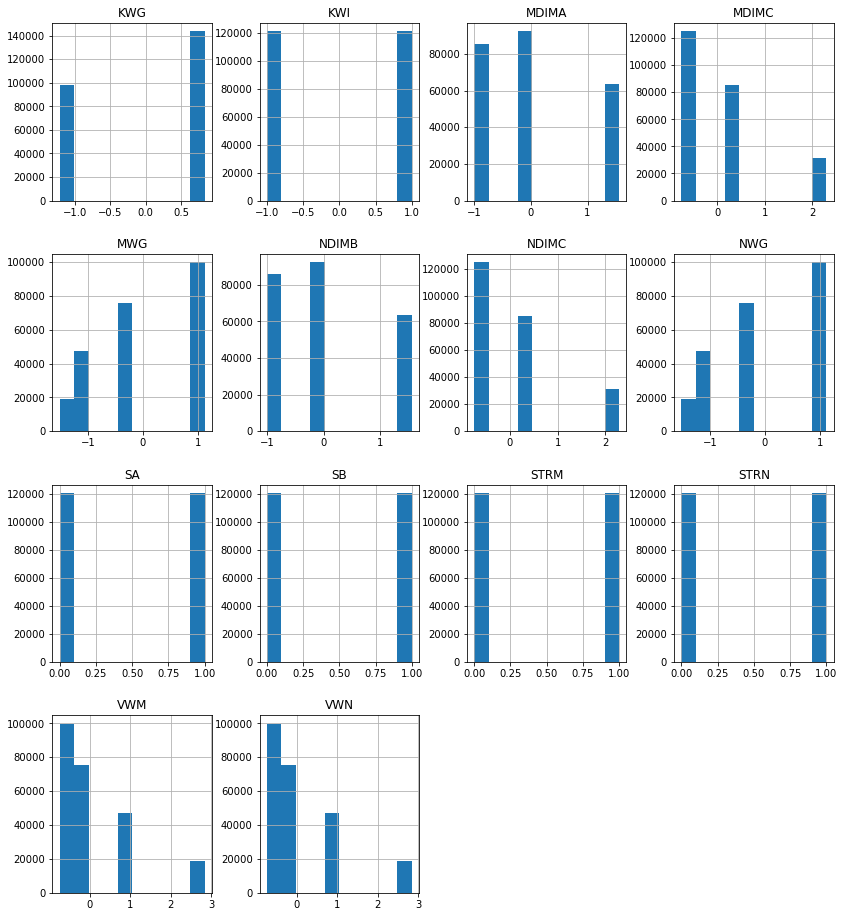

In [7]:
#checking variable distribution
for index in range(10):
    df_test.iloc[:,index] = (df_test.iloc[:,index]-df_test.iloc[:,index].mean()) / df_test.iloc[:,index].std();
df_test.hist(figsize= (14,16));

Text(0.5, 1, 'Variable Correlation')

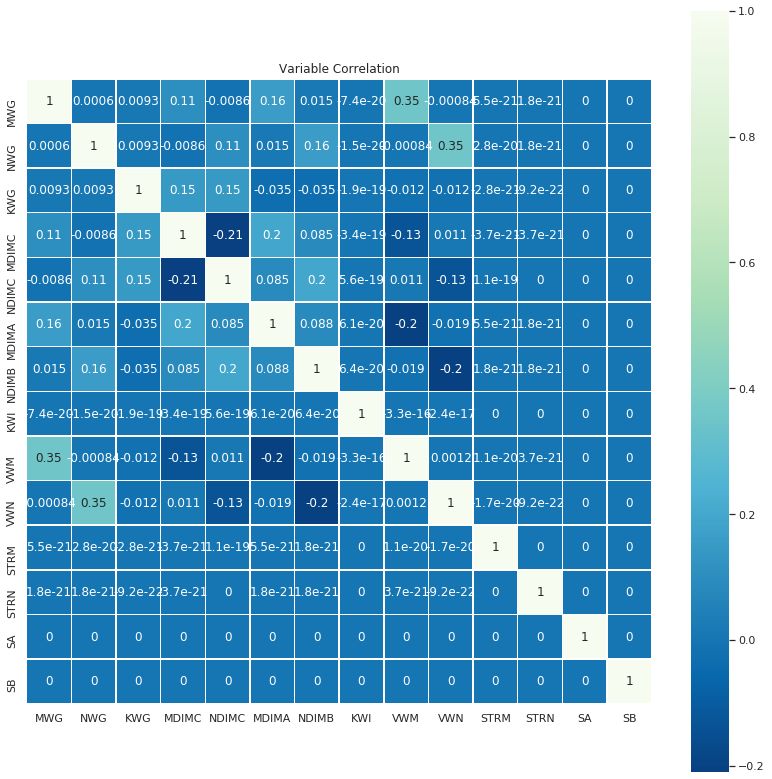

In [8]:
plt.figure(figsize=(14,14))
sns.set(font_scale=1)
sns.heatmap(df_test.corr(),cmap='GnBu_r',annot=True, square = True ,linewidths=.5);
plt.title('Variable Correlation')

In [9]:
#Varibale and predictor
y=np.array(sgemm_df["run_class"])

X=np.array(sgemm_df.iloc[:,0:14])




In [10]:
sc = StandardScaler()
cluster_data = sc.fit_transform(X)

cluster_data[:10]

array([[-1.51675724, -1.51675724, -1.2109972 , -0.75389395, -0.75389395,
        -0.99805388, -0.99805388, -1.        , -0.74144862, -0.74144862,
        -1.        , -1.        , -1.        , -1.        ],
       [-1.51675724, -1.51675724, -1.2109972 , -0.75389395, -0.75389395,
        -0.99805388, -0.99805388, -1.        , -0.74144862, -0.74144862,
        -1.        , -1.        , -1.        ,  1.        ],
       [-1.51675724, -1.51675724, -1.2109972 , -0.75389395, -0.75389395,
        -0.99805388, -0.99805388, -1.        , -0.74144862, -0.74144862,
        -1.        , -1.        ,  1.        , -1.        ],
       [-1.51675724, -1.51675724, -1.2109972 , -0.75389395, -0.75389395,
        -0.99805388, -0.99805388, -1.        , -0.74144862, -0.74144862,
        -1.        , -1.        ,  1.        ,  1.        ],
       [-1.51675724, -1.51675724, -1.2109972 , -0.75389395, -0.75389395,
        -0.99805388, -0.99805388, -1.        , -0.74144862, -0.74144862,
        -1.        ,  1.  

# K-Means

In [11]:
#kmeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)


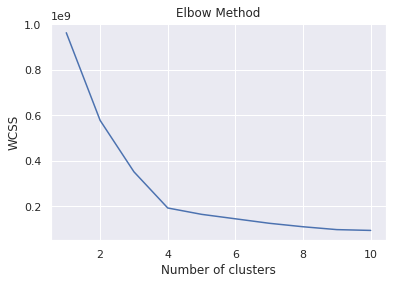

In [12]:
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [13]:
#kmeans
wcss = []
for i in range(1, 21):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(cluster_data)
    wcss.append(kmeans.inertia_)


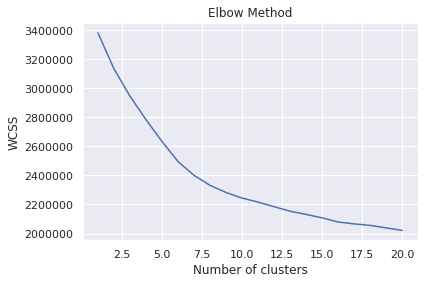

In [14]:
plt.plot(range(1, 21), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [15]:
kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(X)


sgemm_df['clusters1'] = pred_y

sgemm_df.clusters1.unique()
sgemm_df['clusters1'].value_counts()

0    83232
3    58560
1    58560
2    41248
Name: clusters1, dtype: int64

In [16]:
s = silhouette_score(X, kmeans.labels_)
print('Silhouette Score:', s)

Silhouette Score: 0.5296694030788465


# PCA

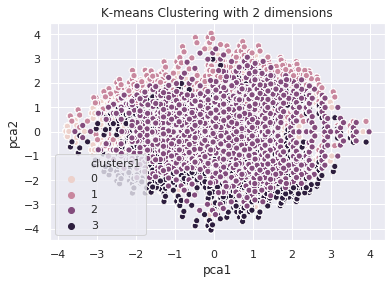

In [17]:
### Run PCA on the data and reduce the dimensions in pca_num_components dimensions
reduced_data = PCA(n_components=2).fit_transform(cluster_data)
results = pd.DataFrame(reduced_data,columns=['pca1','pca2'])

sns.scatterplot(x="pca1", y="pca2", hue=sgemm_df['clusters1'], data=results)
plt.title('K-means Clustering with 2 dimensions')
plt.show()

[4.53639997e-01 4.52928645e-01 2.52855826e-02 2.10774165e-02
 1.72858772e-02 1.71234688e-02 8.64408260e-03 2.25738761e-03
 7.53872687e-04 7.52849140e-04 6.27052115e-05 6.27052115e-05
 6.27052115e-05 6.27052115e-05]


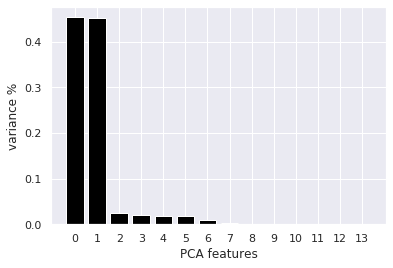

In [18]:
# Create a PCA instance: pca
pca = PCA(n_components=14)
principalComponents = pca.fit_transform(X)# Plot the explained variances
features = range(pca.n_components_)
plt.bar(features, pca.explained_variance_ratio_, color='black')
plt.xlabel('PCA features')
plt.ylabel('variance %')
plt.xticks(features)
print(pca.explained_variance_ratio_)
# Save components to a DataFrame
PCA_components = pd.DataFrame(principalComponents)

Text(0, 0.5, 'PCA 2')

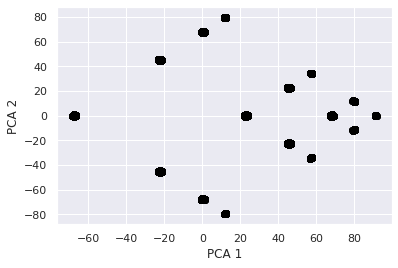

In [19]:
plt.scatter(PCA_components[0], PCA_components[1], alpha=.1, color='black')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')

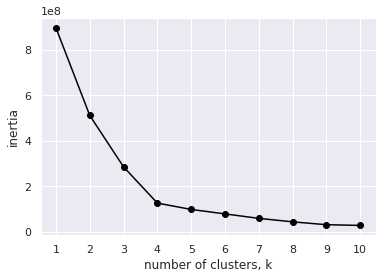

In [20]:
ks = range(1, 11)
inertias = []
for k in ks:
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters=k)
    
    # Fit model to samples
    model.fit(PCA_components.iloc[:,:3])
    
    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
    
plt.plot(ks, inertias, '-o', color='black')
plt.xlabel('number of clusters, k')
plt.ylabel('inertia')
plt.xticks(ks)
plt.show()

In [21]:
PCA_components.iloc[:,:3]

,0,1,2
0,91.747630,8.157135e-11,-11.494654
1,91.747630,6.183338e-11,-11.494654
2,91.747630,6.207046e-11,-11.494654
3,91.747630,6.211174e-11,-11.494654
4,91.747630,6.212052e-11,-11.494654
...,...,...,...
241595,-68.593443,-4.639109e-11,25.477561
241596,-68.593443,-4.639111e-11,25.477561
241597,-68.593443,-4.639110e-11,25.477561
241598,-68.593443,-4.639110e-11,25.477561


In [22]:
kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(PCA_components.iloc[:,:3])

sgemm_df['clusters_pca'] = pred_y


sgemm_df.clusters_pca.unique()
sgemm_df['clusters_pca'].value_counts()

0    83232
2    58560
1    58560
3    41248
Name: clusters_pca, dtype: int64

In [23]:
s = silhouette_score(PCA_components.iloc[:,:3], kmeans.labels_)
print('Silhouette Score:', s)

Silhouette Score: 0.6394440586190562


In [24]:
PCA_components.iloc[:,:3]

,0,1,2
0,91.747630,8.157135e-11,-11.494654
1,91.747630,6.183338e-11,-11.494654
2,91.747630,6.207046e-11,-11.494654
3,91.747630,6.211174e-11,-11.494654
4,91.747630,6.212052e-11,-11.494654
...,...,...,...
241595,-68.593443,-4.639109e-11,25.477561
241596,-68.593443,-4.639111e-11,25.477561
241597,-68.593443,-4.639110e-11,25.477561
241598,-68.593443,-4.639110e-11,25.477561


In [25]:
import plotly.express as px
#df = px.data.iris()
fig = px.scatter_3d(PCA_components.iloc[:,:3], x=0, y=1, z=2,
            color=pred_y)
fig.show()



# RCA

In [26]:
rca = GaussianRandomProjection(n_components=4, eps=0.1, random_state=42)
X_rca=rca.fit_transform(X)


Text(0, 0.5, 'ICA 2')

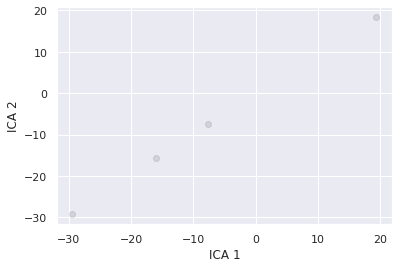

In [27]:
plt.scatter(X_rca[0], X_rca[1], alpha=.1, color='black')
plt.xlabel('ICA 1')
plt.ylabel('ICA 2')

Text(0.5, 1.0, 'KMeans - ICA')

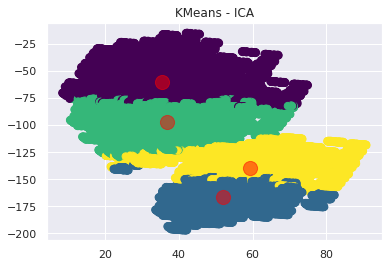

In [28]:
## K-Means Clustering Algorithm using RCA
kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(X_rca)

sgemm_df['clusters_ica'] = pred_y        
#print(correct/len(X_ica))
#yp=kmeans.predict(ica_X_train)
plt.scatter(X_rca[:, 0], X_rca[:, 1], c=pred_y, s=50, cmap='viridis')
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=200, alpha=0.5)
plt.title('KMeans - ICA')

In [29]:
s_srp = silhouette_score(X, kmeans.labels_)
print('Silhouette Score:', s_srp)

Silhouette Score: 0.1971921539466396


In [30]:
X.shape
y.shape

(241600,)

# Feature Selection - Random Forest

In [31]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=42)

In [32]:
X_train.shape

(169120, 14)

In [33]:
sel = SelectFromModel(RandomForestClassifier(n_estimators = 100))
sel.fit(X_train, y_train)

SelectFromModel(estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                                 class_weight=None,
                                                 criterion='gini',
                                                 max_depth=None,
                                                 max_features='auto',
                                                 max_leaf_nodes=None,
                                                 max_samples=None,
                                                 min_impurity_decrease=0.0,
                                                 min_impurity_split=None,
                                                 min_samples_leaf=1,
                                                 min_samples_split=2,
                                                 min_weight_fraction_leaf=0.0,
                                                 n_estimators=100, n_jobs=None,
                                                 oob_score=False,

In [34]:
boolvec=sel.get_support()
boolvec.astype(bool)
boolvec

array([ True,  True, False,  True,  True, False, False, False, False,
       False, False, False, False, False])

In [35]:
input_file=sgemm_df.iloc[:,0:14]
#X_RF=input_file.loc[:, sel.get_support()]
#input_file=sgemm_df.loc[:, sel.get_support()].head()
selected_feat= input_file.columns[(sel.get_support())]
#selected_feat = np.where(boolvec[:,None], X_train,X_train)
len(selected_feat)

4

In [36]:
print(selected_feat)
#sgemm_df


Index(['MWG', 'NWG', 'MDIMC', 'NDIMC'], dtype='object')


In [37]:
X_RF=input_file.loc[:, sel.get_support()]


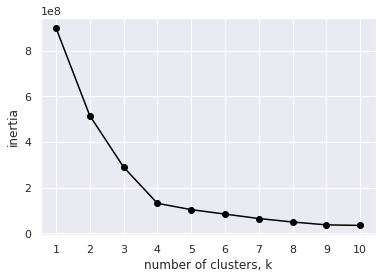

In [38]:
ks = range(1, 11)
inertias = []
for k in ks:
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters=k)
    
    # Fit model to samples
    model.fit(X_RF)
    
    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
    
plt.plot(ks, inertias, '-o', color='black')
plt.xlabel('number of clusters, k')
plt.ylabel('inertia')
plt.xticks(ks)
plt.show()

In [39]:
kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(X_RF)

sgemm_df['clusters_rf'] = pred_y


sgemm_df.clusters_rf.unique()
sgemm_df['clusters_rf'].value_counts()

0    83232
2    58560
1    58560
3    41248
Name: clusters_rf, dtype: int64

In [40]:
s = silhouette_score(X_RF, kmeans.labels_)
print('Silhouette Score:', s)

Silhouette Score: 0.6279871266807147


# ICA

In [41]:
ICA = FastICA(n_components=2, random_state=42) 
X_ica=ICA.fit_transform(X)

Text(0, 0.5, 'ICA 2')

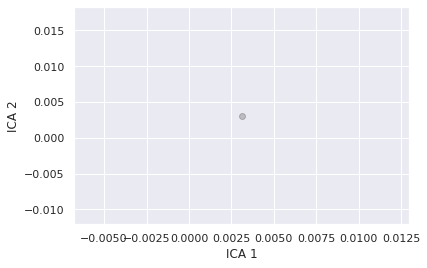

In [42]:
plt.scatter(X_ica[0], X_ica[1], alpha=.1, color='black')
plt.xlabel('ICA 1')
plt.ylabel('ICA 2')

Text(0.5, 1.0, 'KMeans - ICA')

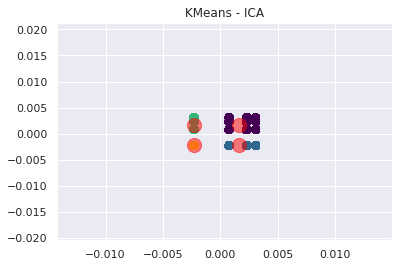

In [43]:
## K-Means Clustering Algorithm using ICA
kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(X_ica)

sgemm_df['clusters_ica'] = pred_y        
#print(correct/len(X_ica))
#yp=kmeans.predict(ica_X_train)
plt.scatter(X_ica[:, 0], X_ica[:, 1], c=pred_y, s=50, cmap='viridis')
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=200, alpha=0.5)
plt.title('KMeans - ICA')

In [44]:


s = silhouette_score(X_ica, kmeans.labels_)
print('Silhouette Score:', s)



Silhouette Score: 0.7161103448362354
